# Seurat clustering of Set 2 (10X, Trypsin)

In [1]:
#loading packages
library(ggplot2)
library(magrittr)
library(data.table)
library(Seurat)
library(Matrix)
library(dplyr)
library(MAST)
library(RColorBrewer)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
 

In [2]:
count.table <- read.csv(file = '../../data/original_data/Set2/umi_count_table_HQC_Set2.csv')
head(count.table)
dim(count.table)

,AAACCCAAGTGACCTT,AAACCCACAAGTGATA,AAACCCACACTTGGCG,AAACCCATCCGTGTCT,AAACGAAAGAATCGTA,AAACGAAAGACTTCCA,AAACGAAAGGGTTAGC,AAACGAAGTGAGGAAA,AAACGAAGTGAGTGAC,AAACGAATCAAGCCTA,⋯,TTTGGTTAGCTAATGA,TTTGGTTTCAGAGTTC,TTTGTTGAGGGTACGT,TTTGTTGAGTACTGGG,TTTGTTGCAAGGTTGG,TTTGTTGCACAACGCC,TTTGTTGCATATCTGG,TTTGTTGCATTCAGCA,TTTGTTGGTCCAGAAG,TTTGTTGGTGTGTGGA
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
Myo81F,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
CR41571,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
CR12798,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
lncRNA:CR46123,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
lncRNA:CR46122,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
CR40182,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


[1] 17504  7314

In [3]:
seu_HQC <- CreateSeuratObject(count.table) 
seu_HQC

An object of class Seurat 
17504 features across 7314 samples within 1 assay 
Active assay: RNA (17504 features, 0 variable features)

In [4]:
is.mt <- grepl(pattern = '^mt:', x = row.names(seu_HQC))
is.rRNA <- grepl(pattern = 'rRNA', x = row.names(seu_HQC))
is.rRNA <- is.rRNA & (!is.mt)
mt.list <- row.names(seu_HQC)[is.mt]
rRNA_list <- row.names(seu_HQC)[is.rRNA]

In [5]:
head(rRNA_list)

[1] "5SrRNA:CR33452" "5SrRNA:CR33451" "5SrRNA:CR33450" "5SrRNA:CR33449"
[5] "5SrRNA:CR33448" "5SrRNA:CR33447"

In [6]:
seu_HQC[["percent.mt"]] <- PercentageFeatureSet(seu_HQC, pattern = "^mt:")
seu_HQC[["percent.rRNA"]] <- PercentageFeatureSet(seu_HQC, features = rRNA_list)

In [7]:
summary(seu_HQC$percent.mt)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.338   5.495   6.502   6.617   7.696  12.414 

In [8]:
summary(seu_HQC$percent.rRNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.3949  1.1349  1.4923  1.7057  2.0603  4.8687 

## Normalize, DR and Clustering

In [9]:
seu_HQC <- suppressWarnings(SCTransform(seu_HQC, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE)) 

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


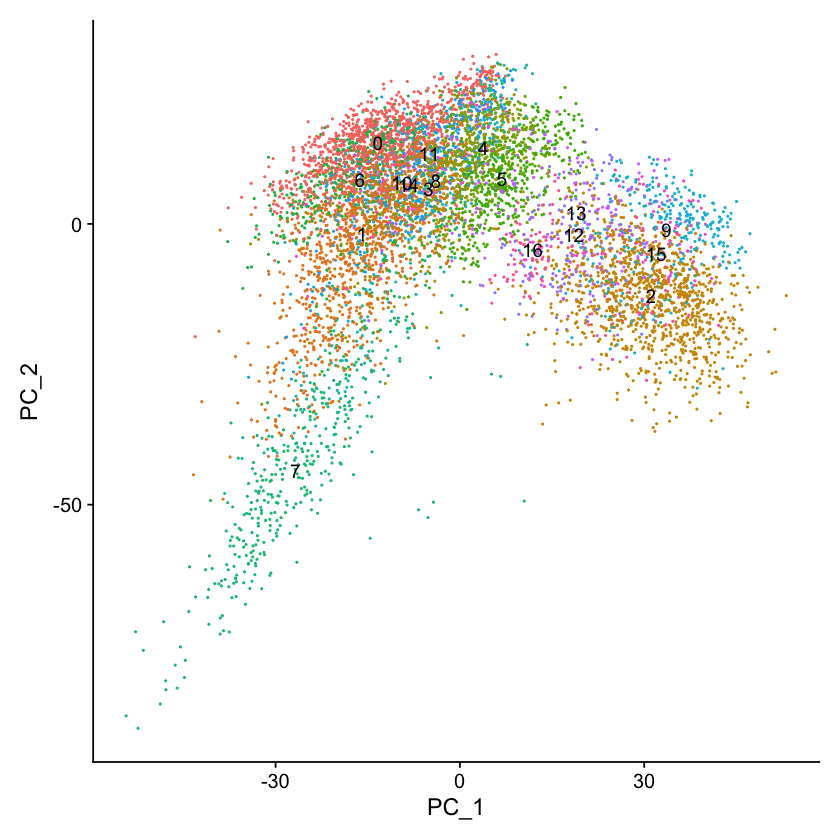

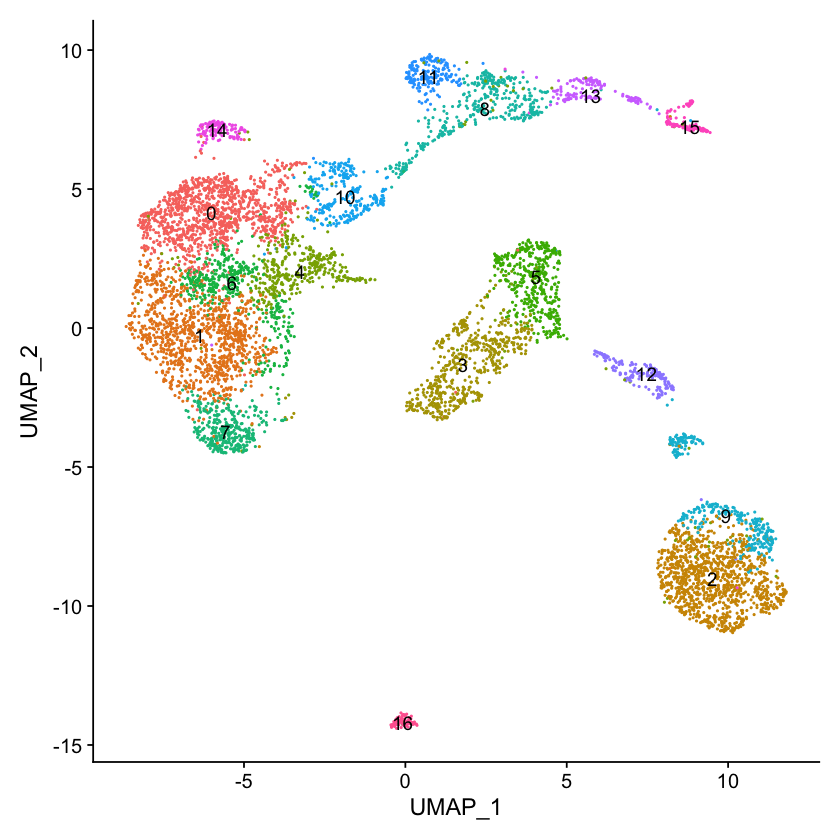

In [10]:
seu_HQC <- RunPCA(seu_HQC, verbose = FALSE)
seu_HQC <- RunUMAP(seu_HQC, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC <- FindNeighbors(seu_HQC, dims = 1:30, verbose = FALSE)
seu_HQC <- FindClusters(seu_HQC, verbose = FALSE)
DimPlot(seu_HQC, reduction =  "pca", label = TRUE) + NoLegend()
DimPlot(seu_HQC, reduction =  "umap", label = TRUE) + NoLegend()

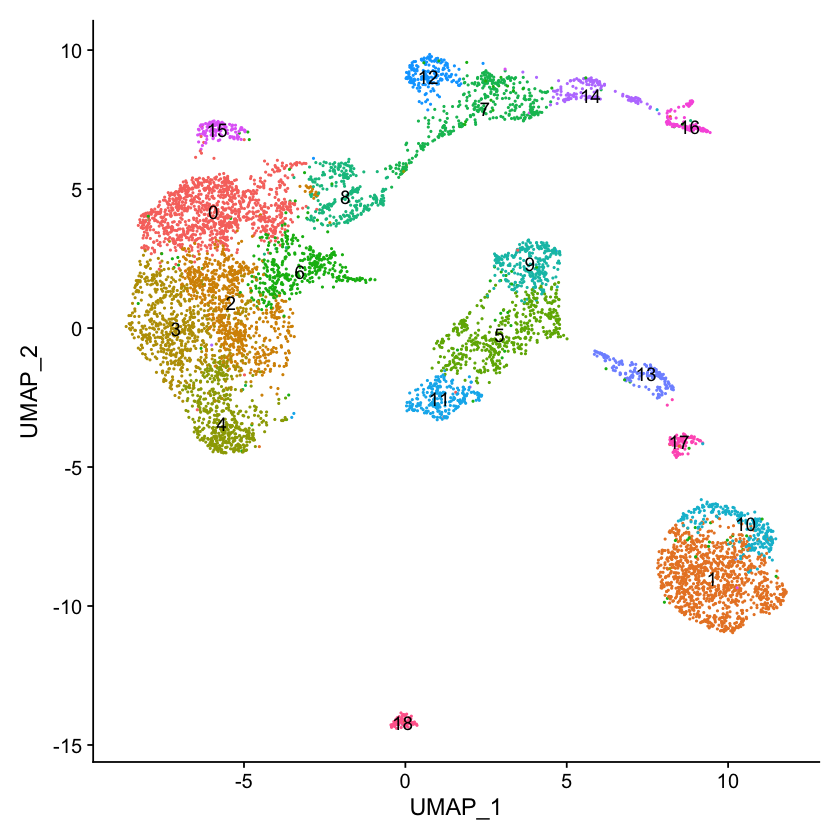

In [11]:
seu_HQC <- FindClusters(seu_HQC, verbose = FALSE, resolution=1)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE) + NoLegend()

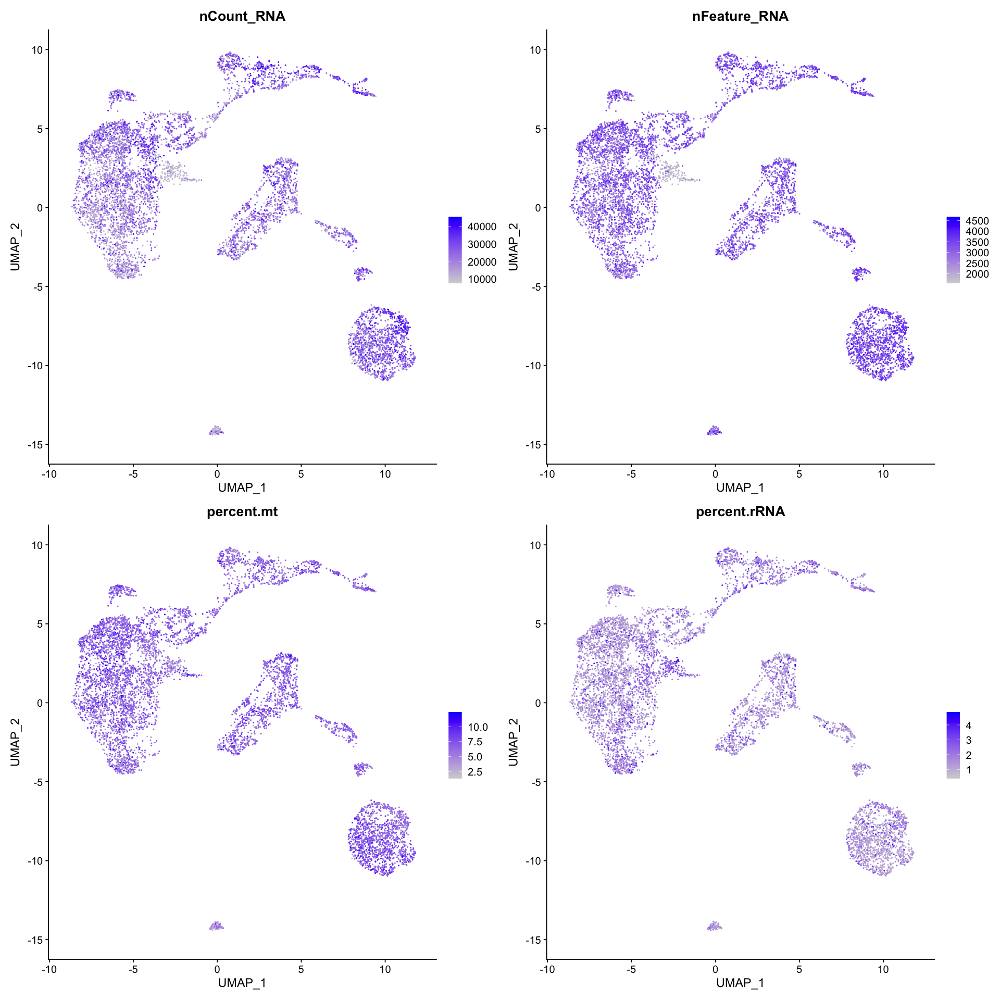

In [12]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("nCount_RNA", "nFeature_RNA", 
                               "percent.mt", "percent.rRNA"), pt.size = 0.2,  ncol = 2)

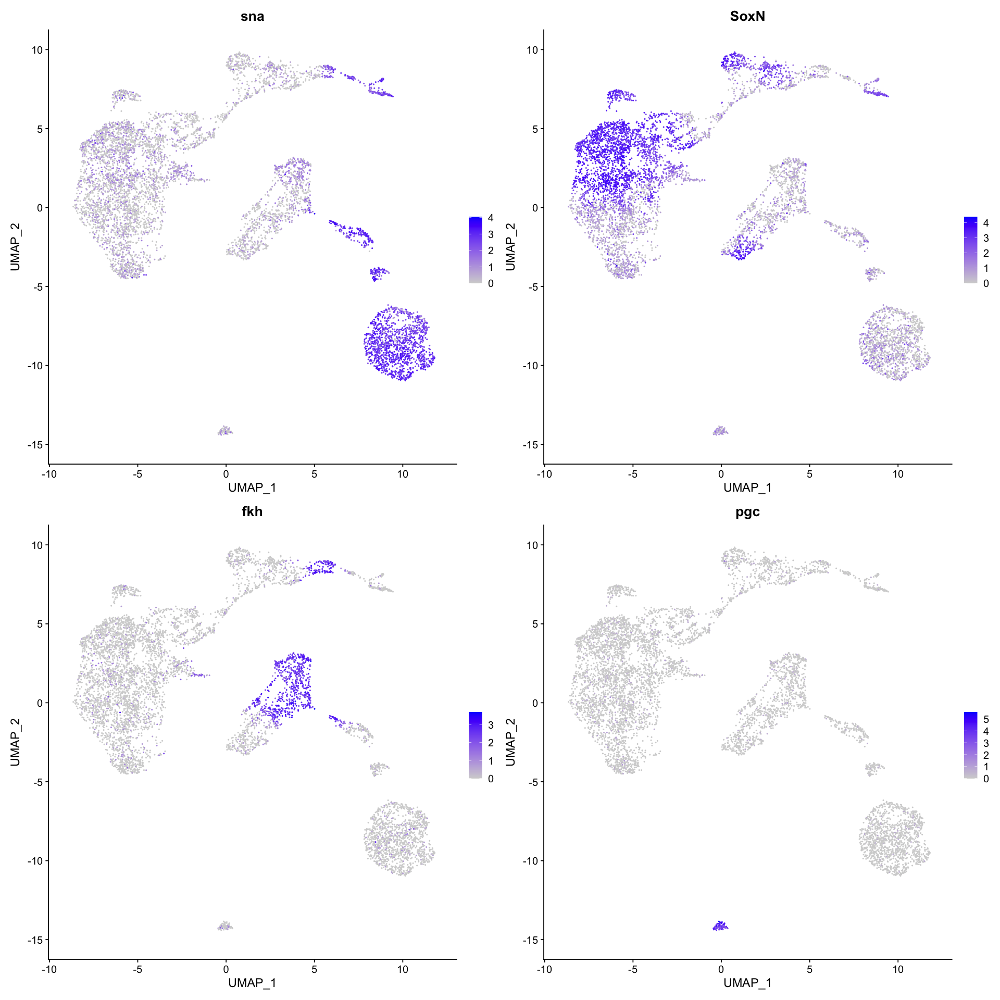

In [13]:
#Major marker genes of each germ layer
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("sna","SoxN", "fkh", "pgc"), pt.size = 0.2,  ncol = 2)

In [14]:
all.markers <- FindAllMarkers(object = seu_HQC, only.pos = TRUE)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18



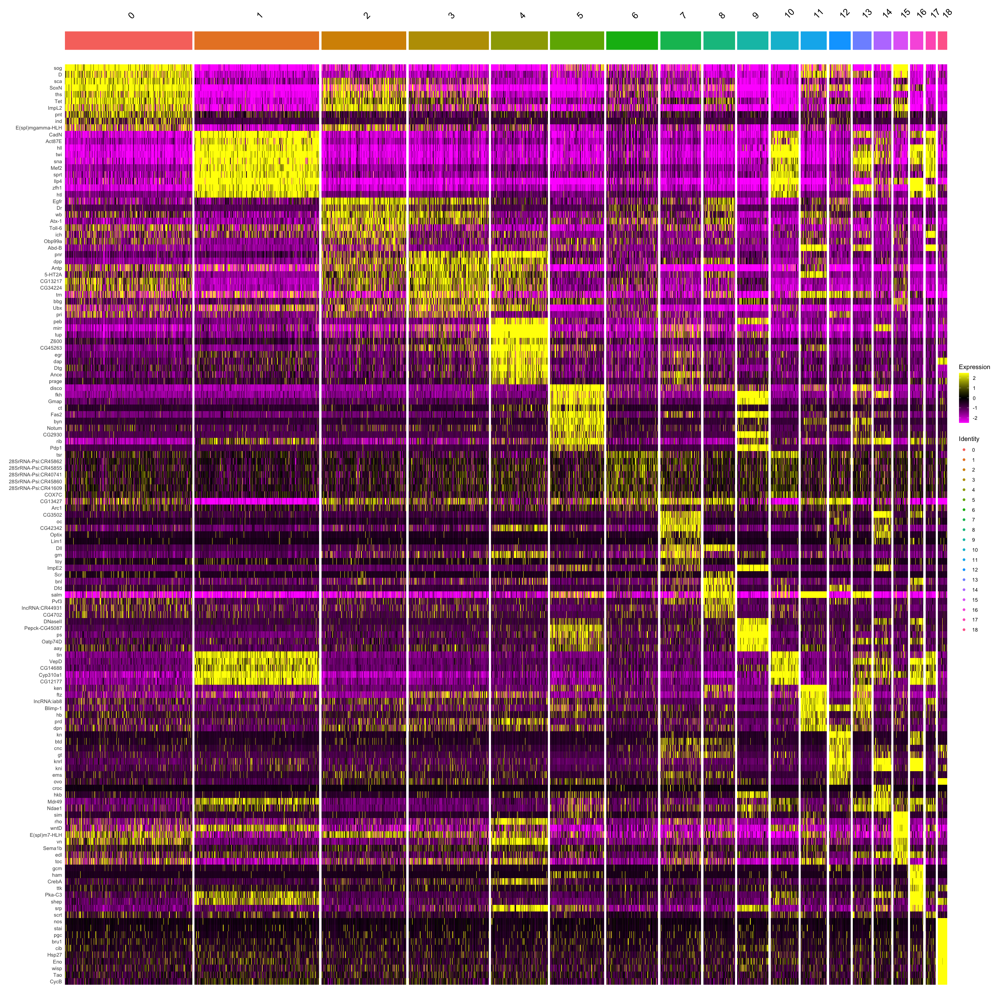

In [15]:
options(repr.plot.width=24, repr.plot.height=24)
DoHeatmap(seu_HQC, features = all.markers.top10$gene)

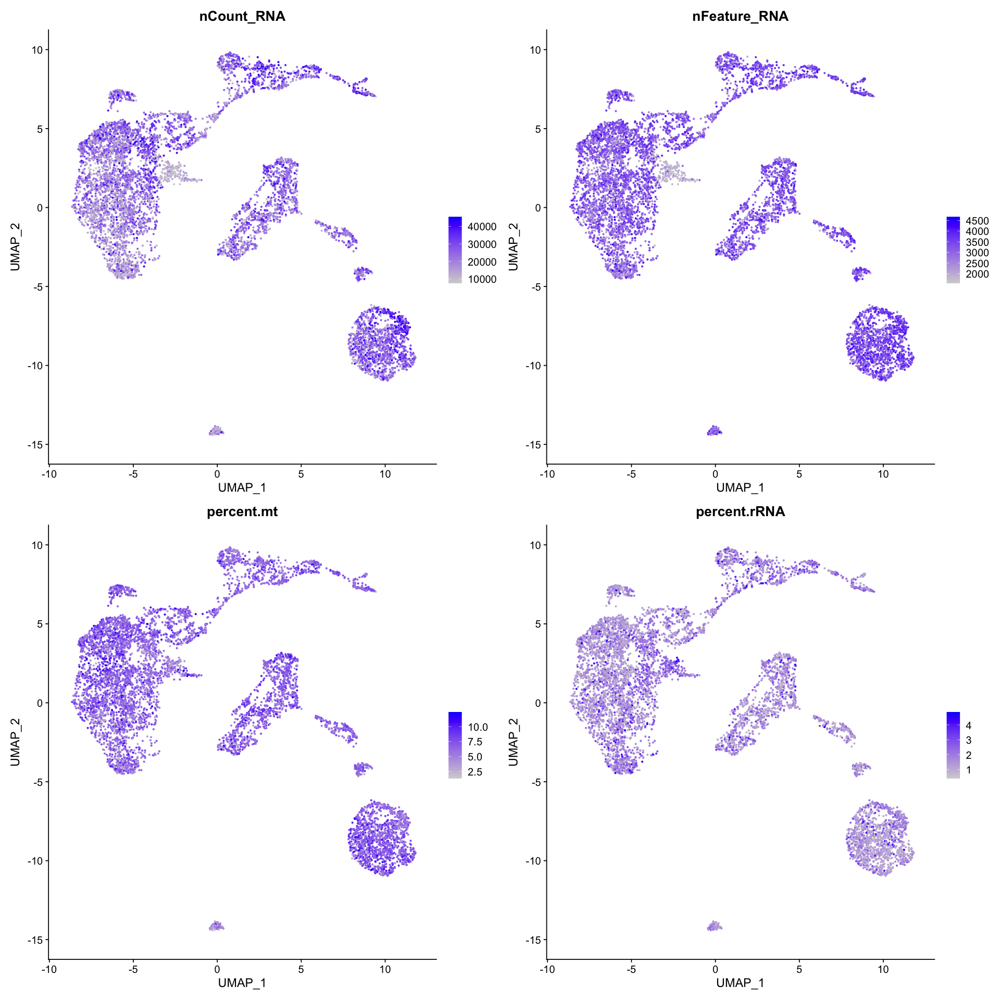

In [16]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("nCount_RNA", "nFeature_RNA", 
                               "percent.mt", "percent.rRNA"), pt.size = 0.5,  ncol = 2)

In [17]:
head(FindMarkers(seu_HQC, ident.1 = "1", ident.2 = "10", test.use = "MAST"), n=30)


 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>----------------------


 Completed [=================================>----------]  78% with 0 failures

 Completed [==================================>---------]  78% with 0 failures

 Completed [==================================>---------]  79% with 0 failures

 Completed [==================================>---------]  80% with 0 failures

 Completed [==================================>---------]  81% with 0 failures

 Completed [===================================>--------]  81% with 0 failures

 Completed [===================================>--------]  82% with 0 failures

 Completed [===================================>--------]  83% with 0 failures

 Completed [====================================>-------]  83% with 0 failures

 Completed [====================================>-------]  84% with 0 failures

 Completed [====================================>-------]  85% with 0 failures

 Completed [=====================================>------]  85% with 0 failures

 Completed [===========================


 Completed [=======================>--------------------]  54% with 0 failures

 Completed [=======================>--------------------]  55% with 0 failures

 Completed [=======================>--------------------]  56% with 0 failures

 Completed [========================>-------------------]  56% with 0 failures

 Completed [========================>-------------------]  57% with 0 failures

 Completed [========================>-------------------]  58% with 0 failures

 Completed [=========================>------------------]  58% with 0 failures

 Completed [=========================>------------------]  59% with 0 failures

 Completed [=========================>------------------]  60% with 0 failures

 Completed [==========================>-----------------]  60% with 0 failures

 Completed [==========================>-----------------]  61% with 0 failures

 Completed [==========================>-----------------]  62% with 0 failures

 Completed [===========================

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
smt3,1.378030e-89,-0.3775256,1.000,1.000,1.560757e-85
tsr,7.205497e-86,-0.5042628,1.000,1.000,8.160946e-82
His4r,1.127313e-83,-0.4242723,1.000,1.000,1.276795e-79
kis,7.644049e-82,0.6738195,0.999,0.988,8.657650e-78
Fkbp12,7.391129e-80,-0.3946673,1.000,1.000,8.371193e-76
roh,4.088191e-78,-0.5237355,1.000,1.000,4.630285e-74
mt:ND1,5.119387e-78,0.5850379,0.999,1.000,5.798218e-74
robo2,7.626453e-78,0.6954407,0.996,0.938,8.637721e-74
RpL41,8.279232e-77,-0.2805060,1.000,1.000,9.377058e-73


In [18]:
head(FindMarkers(seu_HQC, ident.1 = c("0", "2", "3"), ident.2 = "6", test.use = "MAST"), n=30)


 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>----------------------


 Completed [================================>-----------]  76% with 0 failures

 Completed [=================================>----------]  76% with 0 failures

 Completed [=================================>----------]  77% with 0 failures

 Completed [=================================>----------]  78% with 0 failures

 Completed [==================================>---------]  78% with 0 failures

 Completed [==================================>---------]  79% with 0 failures

 Completed [==================================>---------]  80% with 0 failures

 Completed [==================================>---------]  81% with 0 failures

 Completed [===================================>--------]  81% with 0 failures

 Completed [===================================>--------]  82% with 0 failures

 Completed [===================================>--------]  83% with 0 failures

 Completed [====================================>-------]  83% with 0 failures

 Completed [===========================


 Completed [====================>-----------------------]  48% with 0 failures

 Completed [====================>-----------------------]  49% with 0 failures

 Completed [=====================>----------------------]  49% with 0 failures

 Completed [=====================>----------------------]  50% with 0 failures

 Completed [=====================>----------------------]  51% with 0 failures

 Completed [======================>---------------------]  51% with 0 failures

 Completed [======================>---------------------]  52% with 0 failures

 Completed [======================>---------------------]  53% with 0 failures

 Completed [=======================>--------------------]  53% with 0 failures

 Completed [=======================>--------------------]  54% with 0 failures

 Completed [=======================>--------------------]  55% with 0 failures

 Completed [=======================>--------------------]  56% with 0 failures

 Completed [========================>--

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
lncRNA:roX1,2.519735e-321,0.8412685,1.000,0.998,2.853852e-317
Dl,3.914782e-277,0.8809008,1.000,1.000,4.433882e-273
Tet,4.220539e-238,1.0375999,0.998,0.982,4.780183e-234
Brd,3.633919e-207,1.2485449,0.995,0.971,4.115777e-203
hth,1.320495e-203,0.6381474,1.000,1.000,1.495593e-199
robo2,6.584038e-203,0.8199377,0.998,0.987,7.457082e-199
E(spl)m4-BFM,3.941143e-195,0.8644873,0.996,0.982,4.463739e-191
E(spl)m5-HLH,2.056158e-191,1.1322579,0.942,0.824,2.328804e-187
E(spl)m7-HLH,5.190761e-191,1.1310050,0.980,0.922,5.879056e-187


tsr showed high expression in both of cluster 10 and 6  
Cluster 6 shows lower expression of E(spl)-complex than clusters 0, 2, and 3

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



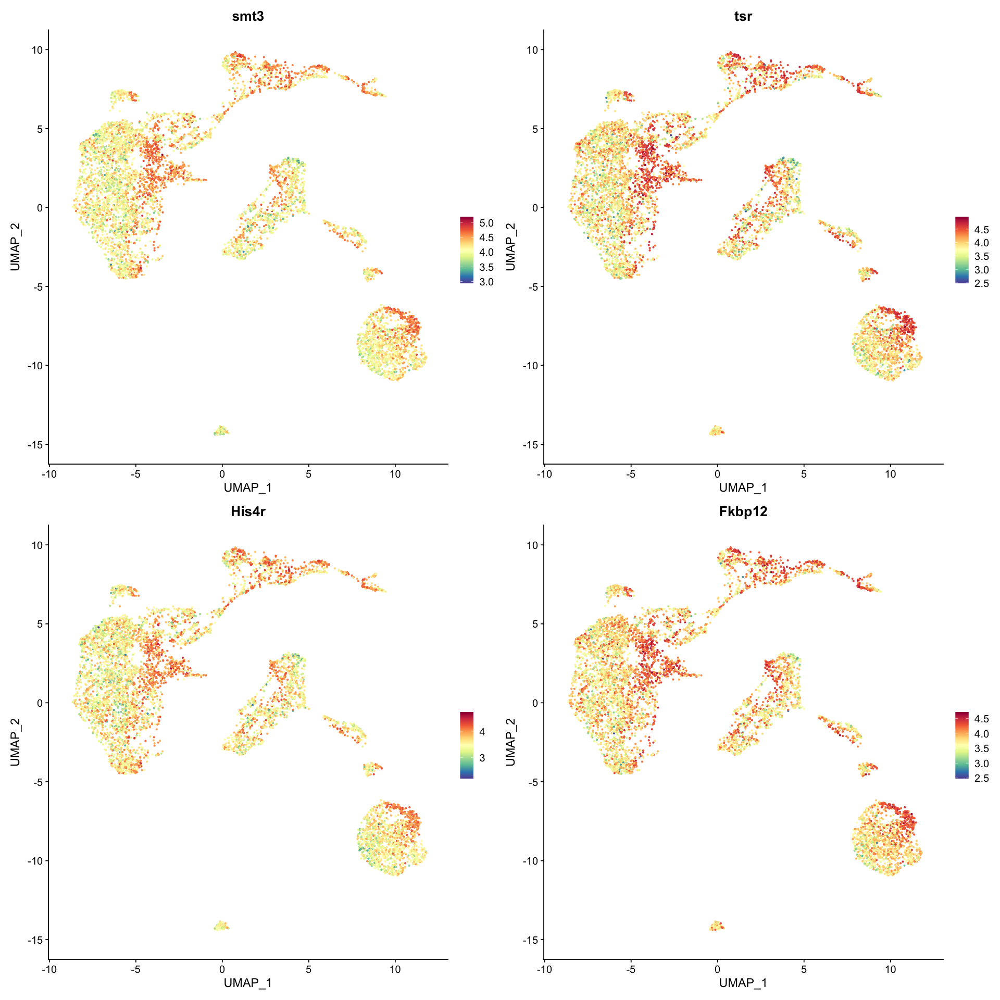

In [19]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("smt3", "tsr", "His4r", "Fkbp12"), pt.size = 0.5,  ncol = 2) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



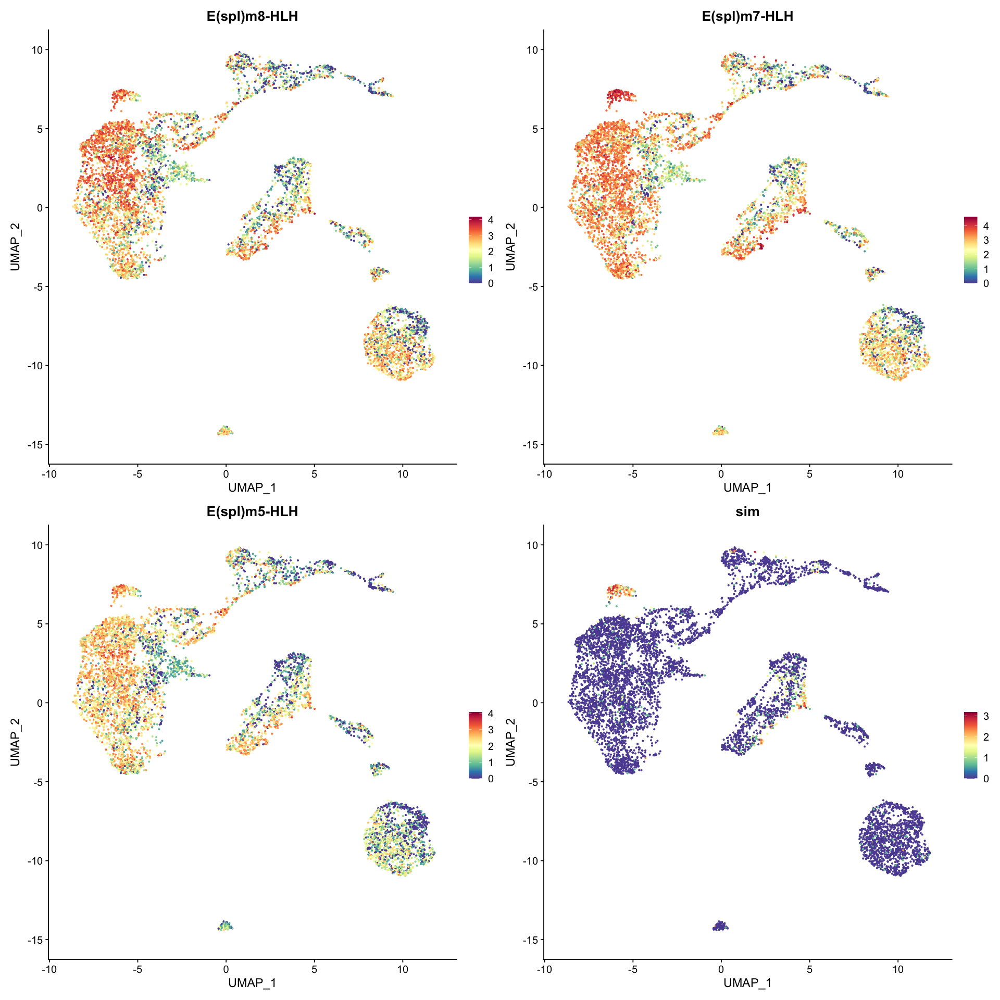

In [20]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("E(spl)m8-HLH", "E(spl)m7-HLH", "E(spl)m5-HLH", "sim"), pt.size = 0.5,  ncol = 2) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

High sim expression in cluster 16 means that it is the cluster of midline cells.  Althogh it is known that E(spl)-C shows restricted expression to the midline cells and amnioserosa, E(spl)-C are expressed in whole-embryo except for tsr-high cells.

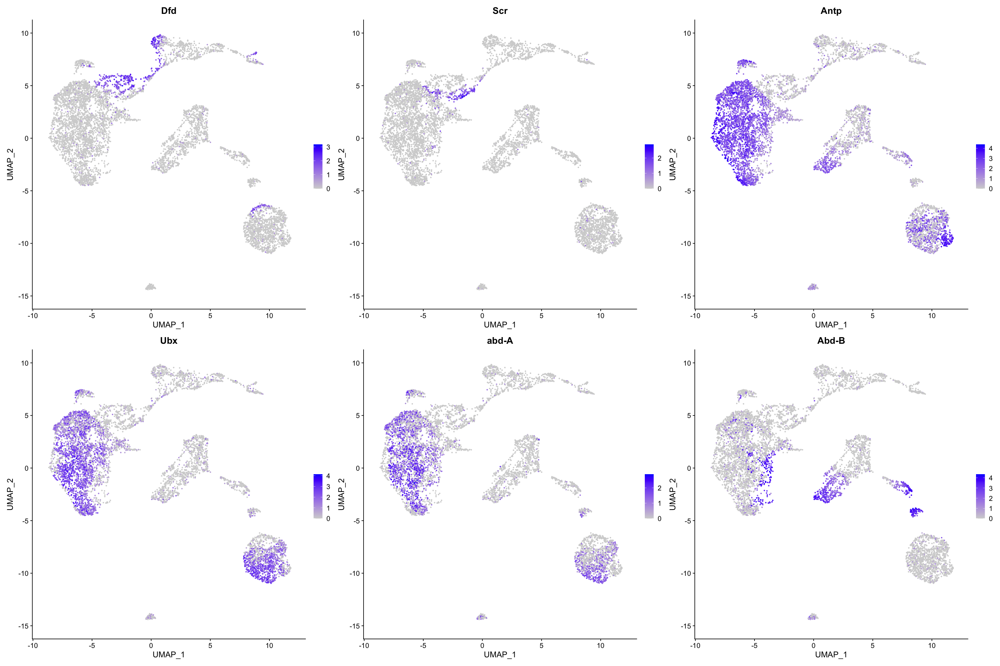

In [21]:
options(repr.plot.width=24, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("Dfd", "Scr", "Antp", "Ubx", "abd-A","Abd-B"),
            pt.size = 0.5,  ncol = 3)

## Cluster Annotation

In [22]:
manual_ID <- as.data.frame(seu_HQC$seurat_clusters)
colnames(manual_ID) <- c('manual_ID')
head(manual_ID)

manual_ID$manual_ID <- dplyr::recode(manual_ID$manual_ID, 
                                        "0" = "Neuroectoderm", #sog
                                        "1" = "Trunk_mesoderm", #sna+, twi+, tin+, Hox form Dfd to abd-A
                                        "2" = "Dorsal_ectoderm_odd", #dpp+, trn-
                                        "3" = "Dorsal_ectoderm_even", #dpp+, trn+
                                        "4" = "Amnioserosa", #dap
                                        "5" = "Hindgut", #fkh, byn,ct,
                                        "6" = "Ectoderm_tsr-high",
                                        "7" = "Head_ectoderm", #oc
                                        "8" = "Ectoderm_PS1-2",
                                        "9" = "Posterior_midgut",#fkh, hkb, ps
                                        "10" = "Mesoderm_tsr-high",
                                        "11" = "Ectoderm_PS14", #Abd-B+, trn+
                                        "12" = "Ectoderm_kn",
                                        "13" = "Posterior_mesoderm", #sna+, twi+, Abd-B+
                                        "14" = "Anterior_midgut", #fkh+, hkb, kni
                                        "15" = "Midline_cells", #sim
                                        "16" = "Anterior_mesoderm", #sna+, twi+, gcm+ 
                                        "17" = "Mesoderm_PS13", #sna+, twi+, Abd-B+, trn-
                                        "18" = "Pole_cells" #pgc
                                     )
head(manual_ID)

,manual_ID
,<fct>
AAACCCAAGTGACCTT,14
AAACCCACAAGTGATA,7
AAACCCACACTTGGCG,5
AAACCCATCCGTGTCT,0
AAACGAAAGAATCGTA,4
AAACGAAAGACTTCCA,4


,manual_ID
,<fct>
AAACCCAAGTGACCTT,Anterior_midgut
AAACCCACAAGTGATA,Head_ectoderm
AAACCCACACTTGGCG,Hindgut
AAACCCATCCGTGTCT,Neuroectoderm
AAACGAAAGAATCGTA,Amnioserosa
AAACGAAAGACTTCCA,Amnioserosa


In [23]:
seu_HQC$annotated_seurat_clusters <- manual_ID

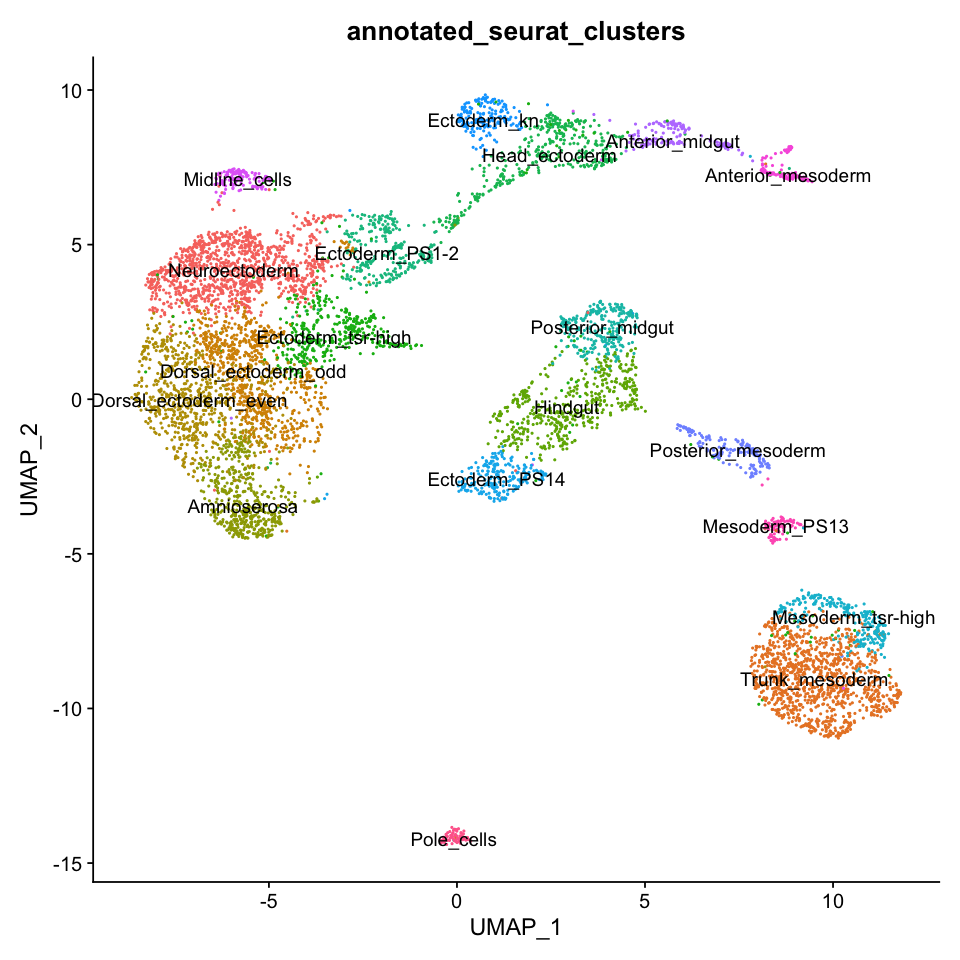

In [24]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE, group.by = 'annotated_seurat_clusters') + NoLegend()

In [25]:
write.table(manual_ID, file = './seurat_clusters.txt')

In [26]:
Idents(seu_HQC) <- "annotated_seurat_clusters"

In [27]:
saveRDS(seu_HQC, file = "../../data/seurat_object/Set2/seu_HQC_Set2.obj")

In [28]:
write.table(all.markers, file="./all.markers.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [29]:
levels <- read.table(file="./seurat_clusters_levels_color_with_tsr_high.txt")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)

[1] "Head_ectoderm"        "Ectoderm_kn"          "Ectoderm_PS1-2"      
[4] "Amnioserosa"          "Dorsal_ectoderm_odd"  "Dorsal_ectoderm_even"

[1] 19

[1] "skyblue2"   "skyblue3"   "skyblue4"   "gray75"     "olivedrab1"
[6] "olivedrab2"

In [30]:
setdiff(seu_HQC$annotated_seurat_clusters, levels)

character(0)

Saving 7 x 7 in image



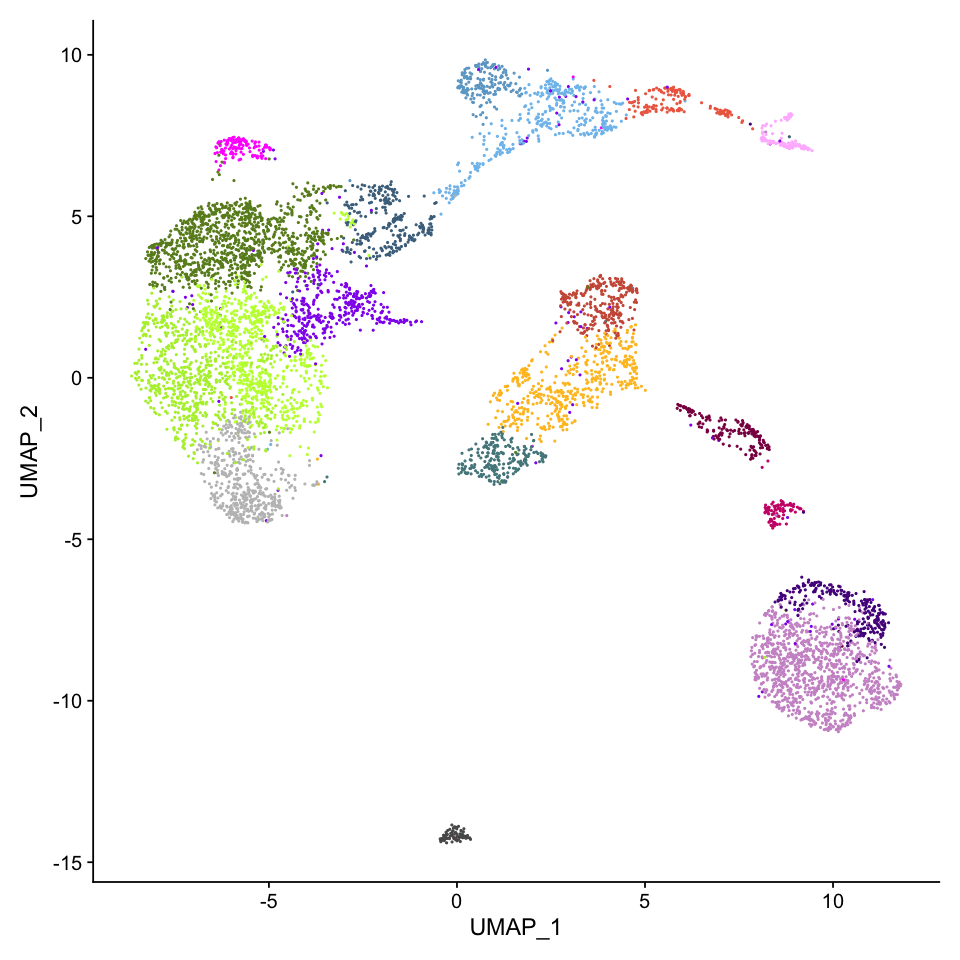

In [31]:
levels(seu_HQC) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC, reduction =  "umap", label = FALSE, cols = colors) + NoLegend() 
fig
ggsave(fig, file = "./figures/01_Seurat_clustering_Set2/With_tsr_high_seurat_cluster_umap_Set2.eps", dpi = 300)

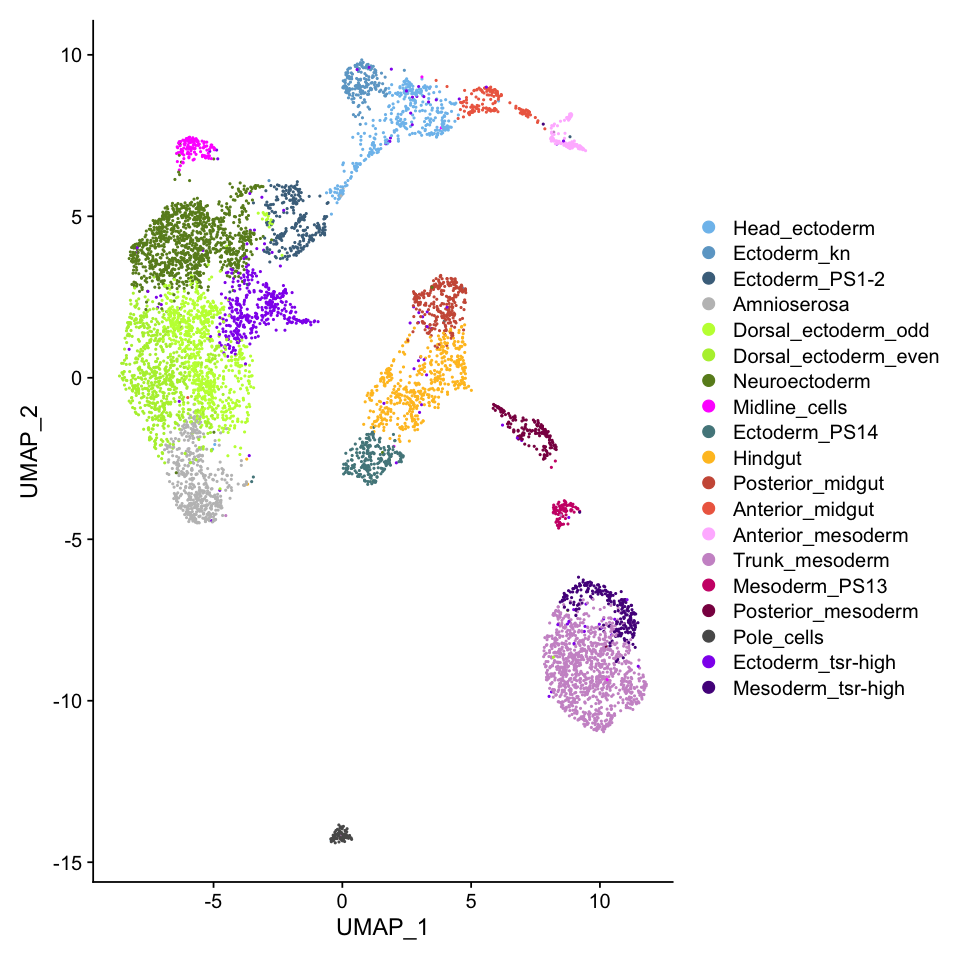

In [32]:
levels(seu_HQC) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC, reduction =  "umap", label = FALSE, cols = colors) 
fig
ggsave(fig, file = "./figures/01_Seurat_clustering_Set2/With_tsr_high_seurat_cluster_umap2_Set2.eps", dpi = 300, width = 12, height =8)

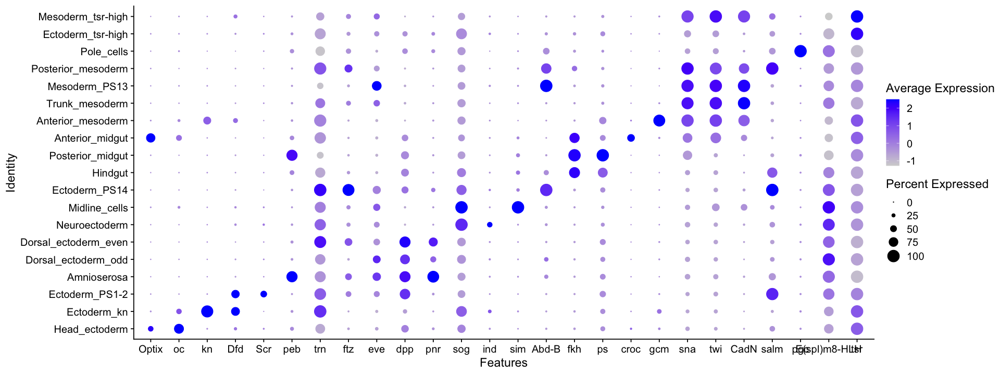

In [33]:
options(repr.plot.width=16, repr.plot.height=6)
fig <- DotPlot(object = seu_HQC, 
        features = c("Optix", "oc", "kn", "Dfd", "Scr", "peb",　"trn", "ftz", "eve","dpp", "pnr", "sog", "ind", "sim", "Abd-B", 
                     "fkh", "ps", "croc", "gcm", "sna", "twi", "CadN", "salm", "pgc", "E(spl)m8-HLH", "tsr"))
fig
ggsave(fig, file = "./figures/01_Seurat_clustering_Set2/With_tsr_high_seurat_cluster_DotPlot_Set2.eps", dpi = 300,  width = 16, height = 6)

In [34]:
path = './figures/gene_expressions_on_UMAP_with_tsr_high'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC, features = name) + theme(plot.title = element_blank())
    basename = paste(name, 'Set2_all_cells_with_tsr_high.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [35]:
path = './figures/gene_expressions_on_UMAP_with_tsr_high'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC, features = name) + NoLegend() + theme(plot.title = element_blank())
    basename = paste(name, 'Set2_all_cells_with_tsr_high_wo_scalebar.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

## tsr-high cells

### Plots

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



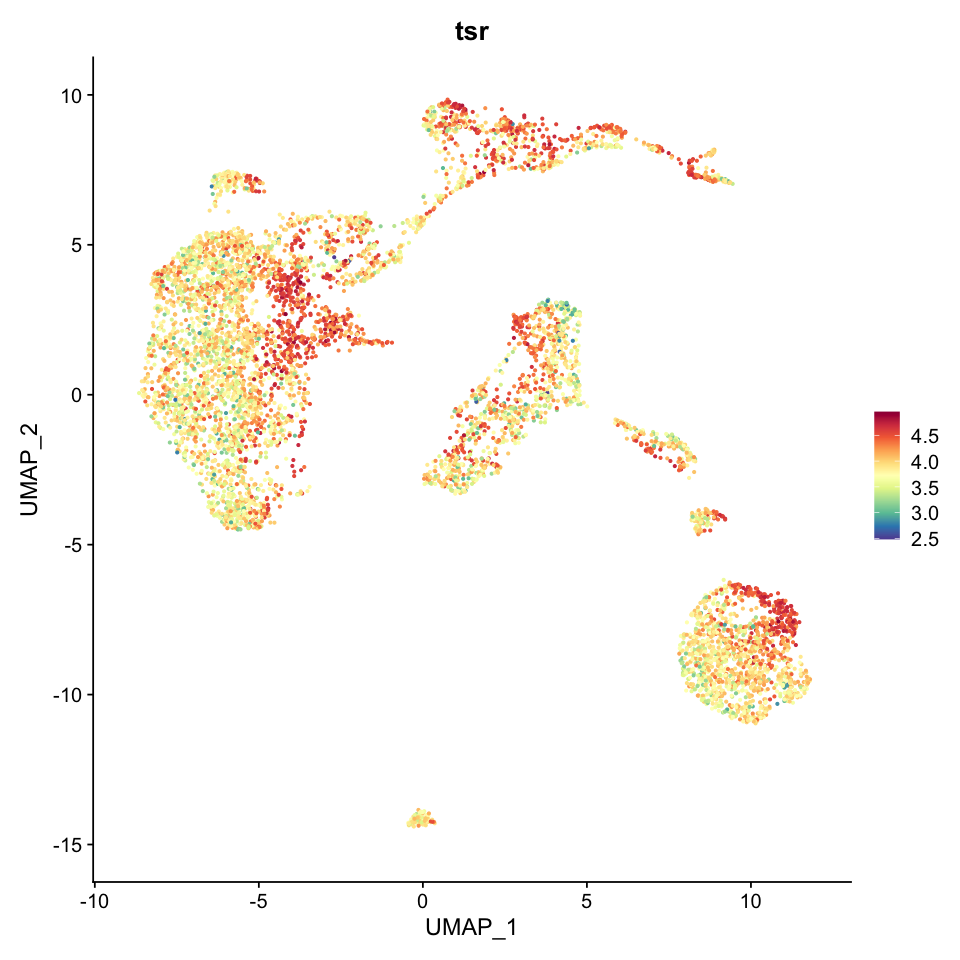

In [36]:
options(repr.plot.width=8, repr.plot.height=8)
p <- FeaturePlot(seu_HQC, reduction = "umap", features = c("tsr"), pt.size = 0.5,  ncol = 1) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

print(p)

ggsave(file = "./figures/01_Seurat_clustering_Set2/10x_trypsin_tsr_umap.pdf", width = 10.24, height = 10.24, plot=p)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



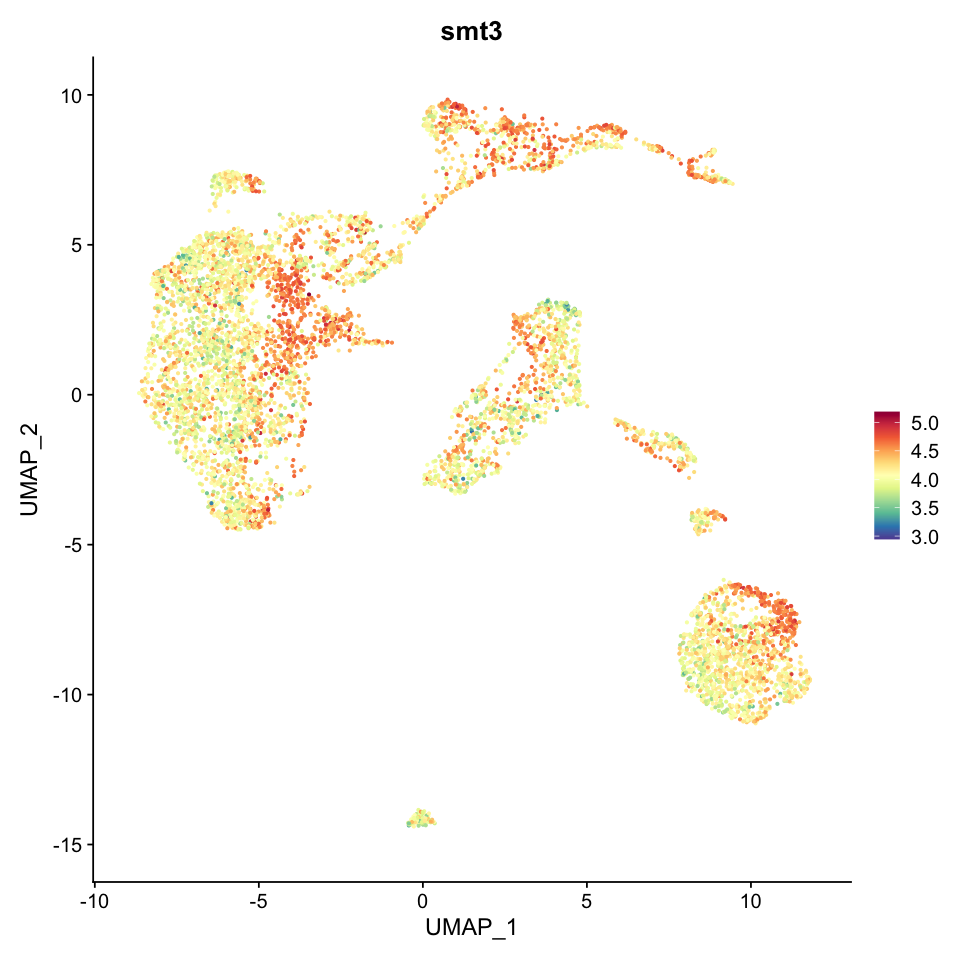

In [37]:
options(repr.plot.width=8, repr.plot.height=8)
p <- FeaturePlot(seu_HQC, reduction = "umap", features = c("smt3"), pt.size = 0.5,  ncol = 1) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

print(p)

# ggsave(file = "./210421_seurat_plot/10x_trypsin_smt3_umap.pdf", width = 10.24, height = 10.24, plot=p)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



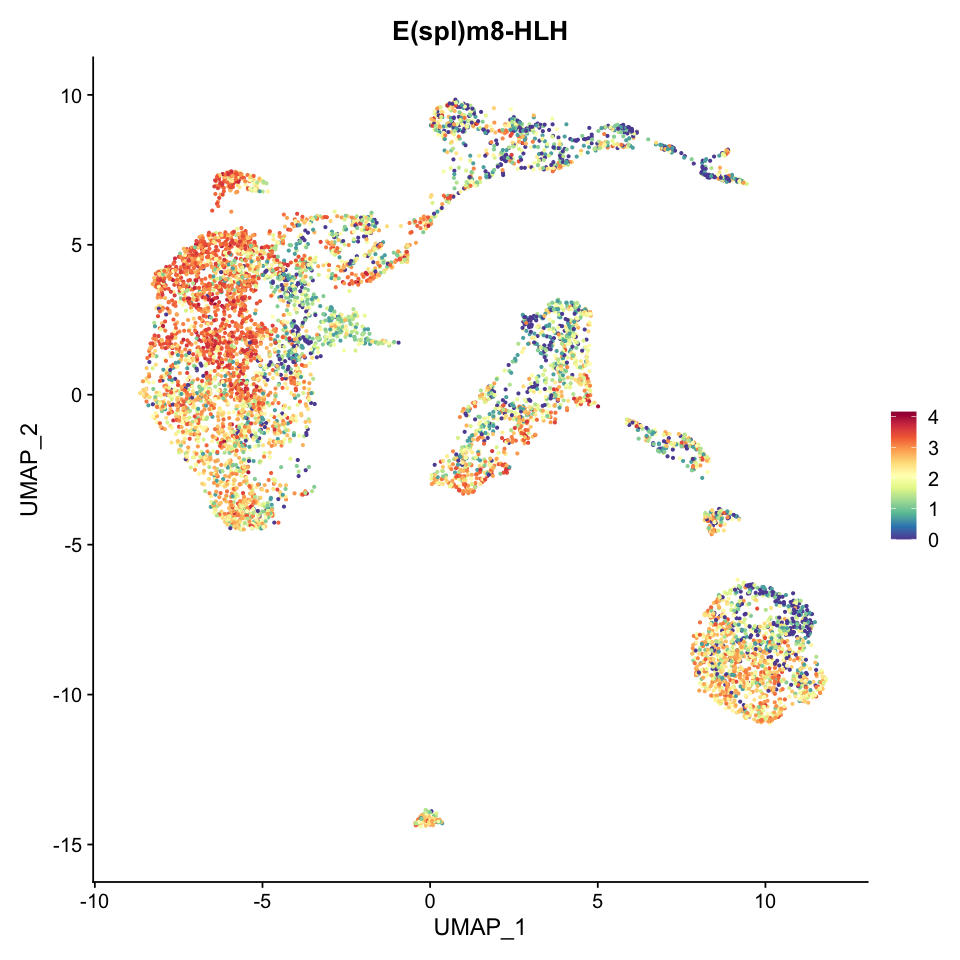

In [38]:
options(repr.plot.width=8, repr.plot.height=8)
p <- FeaturePlot(seu_HQC, reduction = "umap", features = c("E(spl)m8-HLH"), pt.size = 0.5,  ncol = 1) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

print(p)

ggsave(file = "./figures/01_Seurat_clustering_Set2/10x_trypsin_E(spl)m8-HLH_umap.pdf", width = 10.24, height = 10.24, plot=p)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



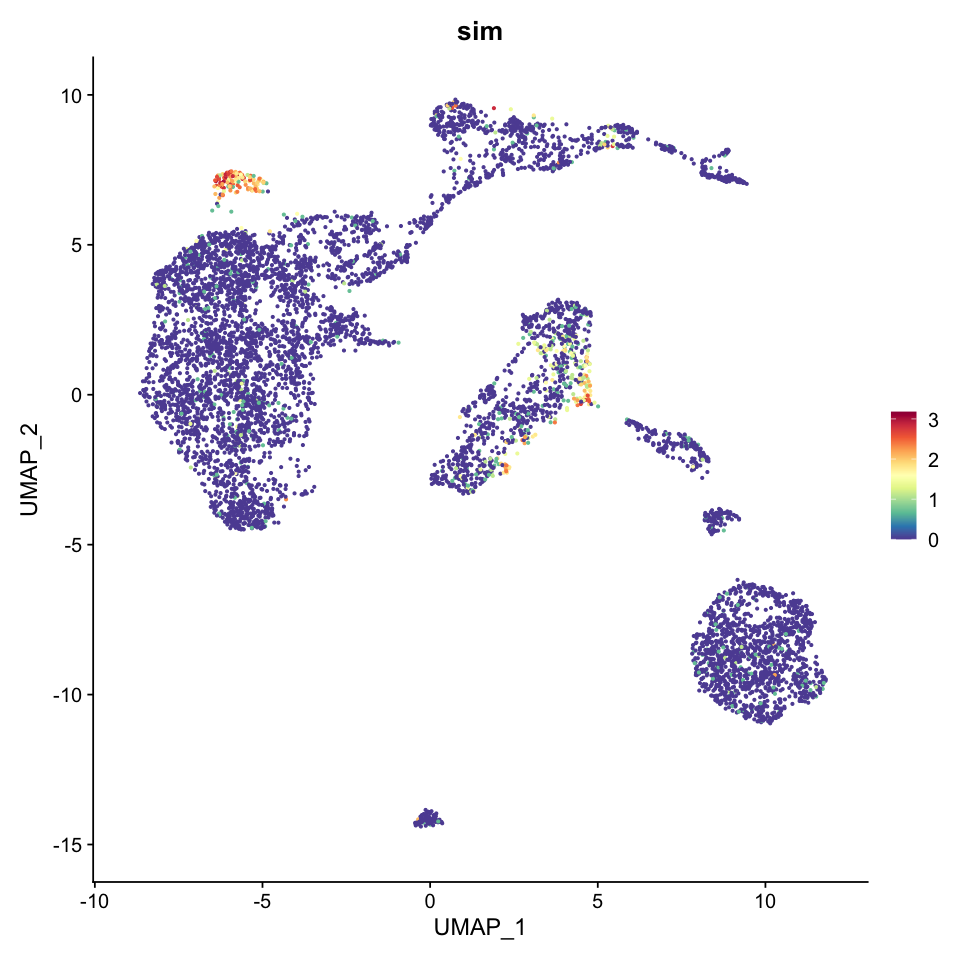

In [39]:
options(repr.plot.width=8, repr.plot.height=8)
p <- FeaturePlot(seu_HQC, reduction = "umap", features = c("sim"), pt.size = 0.5,  ncol = 1) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

print(p)

ggsave(file = "./figures/01_Seurat_clustering_Set2/10x_trypsin_sim_umap.pdf", width = 10.24, height = 10.24, plot=p)

### maker detction for GO term enrichment analysis

In [40]:
Markers_1_VS_10 <- FindMarkers(seu_HQC, ident.1 = "Trunk_mesoderm", ident.2 = "Mesoderm_tsr-high", test.use = "MAST")
dim(Markers_1_VS_10)


 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>----------------------


 Completed [==================================>---------]  78% with 0 failures

 Completed [==================================>---------]  79% with 0 failures

 Completed [==================================>---------]  80% with 0 failures

 Completed [==================================>---------]  81% with 0 failures

 Completed [===================================>--------]  81% with 0 failures

 Completed [===================================>--------]  82% with 0 failures

 Completed [===================================>--------]  83% with 0 failures

 Completed [====================================>-------]  83% with 0 failures

 Completed [====================================>-------]  84% with 0 failures

 Completed [====================================>-------]  85% with 0 failures

 Completed [=====================================>------]  85% with 0 failures

 Completed [=====================================>------]  86% with 0 failures

 Completed [===========================


 Completed [=======================>--------------------]  55% with 0 failures

 Completed [=======================>--------------------]  56% with 0 failures

 Completed [========================>-------------------]  56% with 0 failures

 Completed [========================>-------------------]  57% with 0 failures

 Completed [========================>-------------------]  58% with 0 failures

 Completed [=========================>------------------]  58% with 0 failures

 Completed [=========================>------------------]  59% with 0 failures

 Completed [=========================>------------------]  60% with 0 failures

 Completed [==========================>-----------------]  60% with 0 failures

 Completed [==========================>-----------------]  61% with 0 failures

 Completed [==========================>-----------------]  62% with 0 failures

 Completed [===========================>----------------]  63% with 0 failures

 Completed [===========================

[1] 882   5

In [41]:
write.table(Markers_1_VS_10, file="./Markers_1_VS_10.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [42]:
head(Markers_1_VS_10)

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
smt3,1.378030e-89,-0.3775256,1.000,1.000,1.560757e-85
tsr,7.205497e-86,-0.5042628,1.000,1.000,8.160946e-82
His4r,1.127313e-83,-0.4242723,1.000,1.000,1.276795e-79
kis,7.644049e-82,0.6738195,0.999,0.988,8.657650e-78
Fkbp12,7.391129e-80,-0.3946673,1.000,1.000,8.371193e-76
roh,4.088191e-78,-0.5237355,1.000,1.000,4.630285e-74


In [43]:
cluster10_high <- filter(Markers_1_VS_10, avg_logFC < 0)

In [44]:
head(cluster10_high)

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
smt3,1.378030e-89,-0.3775256,1,1,1.560757e-85
tsr,7.205497e-86,-0.5042628,1,1,8.160946e-82
His4r,1.127313e-83,-0.4242723,1,1,1.276795e-79
Fkbp12,7.391129e-80,-0.3946673,1,1,8.371193e-76
roh,4.088191e-78,-0.5237355,1,1,4.630285e-74
RpL41,8.279232e-77,-0.2805060,1,1,9.377058e-73


In [45]:
#conversion list from gene symbol to Flybase ID
gtf_fbID_list <- read.table(file = "../../GLAD/GLAD_BDGPgtf_conversion_hyphen.txt", header = T)
head(gtf_fbID_list)
tail(gtf_fbID_list)
dim(gtf_fbID_list)

,id_in_Flybase,symbol_in_Flybase,BDGP_ref_id,BDGP_ref_symbol,GO_term_analysis,in_GRAD_db,in_BDGP_gtf
,<chr>,<chr>,<chr>,<chr>,<lgl>,<chr>,<chr>
1,FBgn0085206,CG34177,Edited00000,CG34178-CG34177,TRUE,in_GRAD_db,in_BDGP_gtf
2,FBgn0085207,CG34178,Edited00000,CG34178-CG34177,FALSE,in_GRAD_db,in_BDGP_gtf
3,FBgn0260470,SP555,Edited00001,SP555-CG14042,TRUE,in_GRAD_db,in_BDGP_gtf
4,FBgn0260451,CG14042,Edited00001,SP555-CG14042,FALSE,in_GRAD_db,in_BDGP_gtf
5,FBgn0053995,CG33995,Edited00002,Edited00002,TRUE,in_GRAD_db,in_BDGP_gtf
6,FBgn0264742,CG44000,Edited00002,Edited00002,FALSE,in_GRAD_db,in_BDGP_gtf


,id_in_Flybase,symbol_in_Flybase,BDGP_ref_id,BDGP_ref_symbol,GO_term_analysis,in_GRAD_db,in_BDGP_gtf
,<chr>,<chr>,<chr>,<chr>,<lgl>,<chr>,<chr>
17725,FBgn0283501,lncRNA:CR46115,FBgn0283501,lncRNA:CR46115,TRUE,in_GRAD_db,in_BDGP_gtf
17726,FBgn0267796,Tmc,FBgn0267796,Tmc,TRUE,in_GRAD_db,in_BDGP_gtf
17727,FBgn0286809,xmas,FBgn0286809,xmas,TRUE,in_GRAD_db,in_BDGP_gtf
17728,FBgn0267828,Fatp1,FBgn0267828,Fatp,TRUE,in_GRAD_db,in_BDGP_gtf
17729,NA,NA,FBgnGAL4,GAL4,FALSE,NA,in_BDGP_gtf
17730,NA,NA,FBgnCD8mCherry,CD8mCherry,FALSE,NA,in_BDGP_gtf


[1] 17730     7

In [46]:
cluster10_high_list <- filter(gtf_fbID_list, BDGP_ref_symbol %in% rownames(cluster10_high))
dim(cluster10_high_list)
dim(cluster10_high)

[1] 334   7

[1] 328   5

In [47]:
setdiff(rownames(cluster10_high), cluster10_high_list$BDGP_ref_symbol)

character(0)

In [48]:
setdiff(cluster10_high_list$BDGP_ref_symbol, rownames(cluster10_high))

character(0)

In [49]:
write.table(cluster10_high_list, file="./cluster10_high_list.txt",sep="\t",col.names=T,row.names=T,quote=F)
#このリストのid_in_Flybase をqueryにしてGO解析

In [50]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] RColorBrewer_1.1-2          MAST_1.16.0                
 [3] SingleCellExperiment_1.12.0 SummarizedExperiment_1.20.0
 [5] Biobase_2.50.0              GenomicRanges_1.42.0       
 [7] GenomeInfoDb_1.26.2         IRanges_2.24.1             
 [9] S4Vectors_0.28.1            BiocGenerics_0.36.0        
[11] MatrixGenerics_1.2.0        matrixStats_0.57.0         
[13] dplyr_1.0.3                 Matrix_1.3-2               
[15] Seurat_3.2.3                data.table_1.1